In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import Normalizer

In [2]:
# Información básica de todos los tickers
basic_data = pd.read_csv("Basic_information_cleaned3.csv", index_col=0) 


In [3]:
basic_data

,Name,Currency,Sector,Industry,Country,Insider Percentage,Institution Percentage,Years since IPO,NR - Percentage Missing,NR - Percentage Missing (Only Core),R - Percentage Missing,R - Percentage Missing (Only Core),R - Percentage Missing (Trivial Fix),R - Percentage Missing (Only Core) (Trivial Fix),Market Cap,CAGR,CAGR with divs,Years,Difference CAGR
Ticker,,,,,,,,,,,,,,,,,,,
A,"AGILENT TECHNOLOGIES, INC.",USD,Healthcare,Diagnostics & Research,US,0.0024,0.9126,23,0.173913,0.000000,0.133018,0.0,0.003013,0.0,4.528688e+10,0.065679,0.067759,23.0,0.002080
AA,ALCOA CORPORATION,USD,Basic Materials,Aluminum,US,0.0087,0.8436,8,0.217989,0.166667,0.099010,0.0,0.004950,0.0,7.401581e+09,0.015177,0.018720,8.0,0.003543
AACG,ATA CREATIVITY GLOBAL,USD,Consumer Defensive,Education & Training Services,CN,0.0553,0.1709,14,0.206873,0.008929,0.170437,0.0,0.010558,0.0,8.456380e+07,0.294082,0.478690,14.0,0.184609
AAL,AMERICAN AIRLINES GROUP INC.,USD,Industrials,Airlines,US,0.0108,0.5432,13,0.168627,0.036765,0.087459,0.0,0.000000,0.0,9.895510e+09,0.171994,0.182450,13.0,0.010456
AAOI,"APPLIED OPTOELECTRONICS, INC.",USD,Technology,Semiconductors,US,0.0712,0.5119,9,0.149206,0.013889,0.113861,0.0,0.000000,0.0,2.069533e+08,-0.125239,-0.125239,8.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTS,ZOETIS INC.,USD,Healthcare,Drug Manufacturers—Specialty & Generic,US,0.0024,0.9288,9,0.148148,0.125000,0.070407,0.0,0.000000,0.0,9.015518e+10,0.260344,0.264165,9.0,0.003821
ZUO,"ZUORA, INC.",USD,Technology,Software—Infrastructure,US,0.0089,0.7699,4,0.150476,0.000000,0.116832,0.0,0.000000,0.0,1.975496e+09,-0.084538,-0.084538,4.0,0.000000
ZYME,ZYMEWORKS INC.,USD,Healthcare,Biotechnology,CA,0.0069,0.7926,5,0.184906,0.100000,0.113725,0.0,0.000000,0.0,1.603927e+09,0.397348,0.397348,5.0,0.000000


In [4]:
# Dropeamos las japonesas por mala conversión de moneda
basic_data.drop(basic_data[basic_data["Country"] == "JP"].index, inplace=True)
basic_data.drop(["GLAE","YELL","AUTL","AUTL","KDOZF","CPSH","ICLD","CYTR","RGLS","PTN","ABVC","GTVI","SEEL","EMMA","AIKI","KPRX","MOXC","ELST","VBIX","MLFB","XSPA","LIQT","BIOC","TMBR","TGLO","TKAT","CYCC","AQMS","MTP","AOXY","CXKJ","MARPS","FCIC","NAOV","ZYME","RMED","VERB","RARE","ACAD","CLVS","ITCI","SSOK","AUPH","VHC","CTLP","ONTX","NUWE","ACHV","BLU","BZYR","MNKD","CYCCP","IOR","IBRX","KEGX","BRK-B", "BRK-A","DB","CCUR","LUMO","DSS","TGB","PBR","KGJI","HCMC","SFOR","NSPR","CEI","MPVDF","TLK", "SAVA", "STM"], inplace=True)

In [5]:
basic_data

,Name,Currency,Sector,Industry,Country,Insider Percentage,Institution Percentage,Years since IPO,NR - Percentage Missing,NR - Percentage Missing (Only Core),R - Percentage Missing,R - Percentage Missing (Only Core),R - Percentage Missing (Trivial Fix),R - Percentage Missing (Only Core) (Trivial Fix),Market Cap,CAGR,CAGR with divs,Years,Difference CAGR
Ticker,,,,,,,,,,,,,,,,,,,
A,"AGILENT TECHNOLOGIES, INC.",USD,Healthcare,Diagnostics & Research,US,0.0024,0.9126,23,0.173913,0.000000,0.133018,0.0,0.003013,0.0,4.528688e+10,0.065679,0.067759,23.0,0.002080
AA,ALCOA CORPORATION,USD,Basic Materials,Aluminum,US,0.0087,0.8436,8,0.217989,0.166667,0.099010,0.0,0.004950,0.0,7.401581e+09,0.015177,0.018720,8.0,0.003543
AACG,ATA CREATIVITY GLOBAL,USD,Consumer Defensive,Education & Training Services,CN,0.0553,0.1709,14,0.206873,0.008929,0.170437,0.0,0.010558,0.0,8.456380e+07,0.294082,0.478690,14.0,0.184609
AAL,AMERICAN AIRLINES GROUP INC.,USD,Industrials,Airlines,US,0.0108,0.5432,13,0.168627,0.036765,0.087459,0.0,0.000000,0.0,9.895510e+09,0.171994,0.182450,13.0,0.010456
AAOI,"APPLIED OPTOELECTRONICS, INC.",USD,Technology,Semiconductors,US,0.0712,0.5119,9,0.149206,0.013889,0.113861,0.0,0.000000,0.0,2.069533e+08,-0.125239,-0.125239,8.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTO,ZTO EXPRESS (CAYMAN) INC.,USD,Industrials,Integrated Freight & Logistics,CN,0.0068,0.2839,6,0.132075,0.000000,0.099673,0.0,0.008170,0.0,2.428496e+10,0.161183,0.168624,6.0,0.007441
ZTS,ZOETIS INC.,USD,Healthcare,Drug Manufacturers—Specialty & Generic,US,0.0024,0.9288,9,0.148148,0.125000,0.070407,0.0,0.000000,0.0,9.015518e+10,0.260344,0.264165,9.0,0.003821
ZUO,"ZUORA, INC.",USD,Technology,Software—Infrastructure,US,0.0089,0.7699,4,0.150476,0.000000,0.116832,0.0,0.000000,0.0,1.975496e+09,-0.084538,-0.084538,4.0,0.000000


In [6]:
my_list = []
for country in basic_data["Country"].unique():
    my_list.append({country:basic_data[basic_data["Country"] == country]["Country"].index[0]})


## Arreglos

In [7]:
# La fecha de IPO estaba mal
# res_df.loc["DB", "Years since IPO"] = 2022 - 2001

In [8]:
# En 2010 y 2015 hay más acciones normales que diluted
# Lo solucionamos asumiendo que las acciones diluted son iguales a las normales
# fundamental_data = pd.read_csv("FinalFundamentals\\BYDDF.csv", index_col=0)

# fundamental_data.loc[2010, "Weighted Average Shares Outstanding Diluted"] = fundamental_data.loc[2010, "Weighted Average Shares Outstanding"]
# fundamental_data.loc[2015, "Weighted Average Shares Outstanding Diluted"] = fundamental_data.loc[2015, "Weighted Average Shares Outstanding"]

# # En consecuencia también cambios el valor de los beneficios diluidos
# fundamental_data.loc[2010, "EPS Diluted"] = fundamental_data.loc[2010, "EPS"]
# fundamental_data.loc[2015, "EPS Diluted"] = fundamental_data.loc[2015, "EPS"]

# fundamental_data.to_csv("FinalFundamentals\\BYDDF.csv")

In [9]:

# fundamental_data = pd.read_csv("FinalFundamentals\\CWCO.csv", index_col=0)

# fundamental_data.drop(2021, axis=0, inplace=True)

# fundamental_data.to_csv("FinalFundamentals\\CWCO.csv")

In [10]:

# ticker = "GLP"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2005, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [98]:

# ticker = "TAL"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2014,2015,2016,2017,2018], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [11]:

# ticker = "AMPY"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2021, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [12]:

# ticker = "FAT"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2021, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [13]:

# ticker = "LOCO"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2021, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [14]:

# ticker = "SOHO"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2004,2021], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [15]:

# ticker = "CPIX"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2021, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [16]:

# ticker = "CAPC"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2021, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [101]:

# ticker = "SOHOO"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2021, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [17]:

# ticker = "IPDN"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2021, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [18]:

# ticker = "NTAP"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2009, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [19]:

# ticker = "CORR"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2011, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [20]:

# ticker = "Y"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2008,2009,2010], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [21]:

# ticker = "SNFCA"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2006,2010,2011], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [22]:

# ticker = "GHL"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2004,2005,2006,2007], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [23]:

# ticker = "MHLD"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2009,2010], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [24]:

# ticker = "KINS"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2019, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [25]:

# ticker = "DGICB"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2007,2008,2009,2010,2011], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [26]:

# ticker = "FMBM"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2008,2009,2010,2011,2012], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [27]:

# ticker = "RUTH"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2005,2007], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [28]:

# ticker = "FNHC"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2005, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [29]:

# ticker = "GBOX"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2021, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [30]:

# ticker = "BBGI"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2021, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [31]:

# ticker = "ICCH"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2020,2021], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [32]:

# ticker = "GSL"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2016, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [33]:

# ticker = "HWKN"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2002,2003,2004,2005,2006,2007,2008], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [34]:

# ticker = "EVK"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2008,2009,2010,2011,2012,2013,2014], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [35]:

# ticker = "JOUT"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2006,2007,2008], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [36]:

# ticker = "GGB"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([1999,2000,2001], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [37]:

# ticker = "SYNL"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2004,2007,2009], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [38]:

# ticker = "SYNL"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2012, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [39]:

# ticker = "JAN"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2004, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [40]:

# ticker = "OMEX"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2000,2001,2002,2003], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [41]:

# ticker = "WINA"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2002,2003,2004,2006,2007,2008,2009,2010], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [42]:

# ticker = "CX"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2012, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [43]:

# ticker = "CPSH"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2006,2007,2010,2012], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [44]:

# ticker = "LNC"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2002,2003,2004,2005], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [45]:

# ticker = "MAC"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2013, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [46]:

# ticker = "AIZ"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2004, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [47]:

# ticker = "JNCE"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2021, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [48]:

# ticker = "UONEK"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2002,2003], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [49]:

# ticker = "ENIA"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2008], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [50]:

# ticker = "TAL"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2011,2012,2013], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [51]:

# ticker = "BIO-B"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2019, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [52]:

# ticker = "DY"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2002,2003], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [53]:

# ticker = "CAAS"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop([2005,2006,2007,2008,2009,2010], axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [54]:

# ticker = "COHN"
# fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)
# fundamental_data.drop(2021, axis=0, inplace=True)


# fundamental_data.to_csv("FinalFundamentals\\"+ticker+".csv")

In [55]:
# Construcción del dataset
aux_fundamental_data = pd.read_csv("FinalFundamentals\\FB.csv", index_col=0)

# Solo nos interesan las columans numéricas
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric_df = basic_data.select_dtypes(include=numerics)

# Array vacío para guardar los resultados
res = np.empty([numeric_df.shape[0], numeric_df.shape[1] + aux_fundamental_data.shape[1]])

num = 0
for index, row in numeric_df.iterrows():
    ticker = index
    # Abrimos los fundamentales con el precio
    fundamental_data = pd.read_csv("FinalFundamentals\\"+ticker+".csv", index_col=0)

    try:
        fundamental_data.drop("Forex Rate", axis=1, inplace=True)
    except:
        pass

    # Cogemos la media de los valores
    fundamental_data = fundamental_data.mean()

    # Cogemos la fila correspondiente de numeric_df
    aux = numeric_df.loc[ticker, :]

    if len(fundamental_data) == 198:
        print(ticker)

    # Las juntamos y las guardamos en el array
    res[num, :] = aux.append(fundamental_data).to_numpy()
    num += 1

# Una vez creado el array, lo pasamos a un dataframe
res_df = pd.DataFrame(res, index=numeric_df.index,columns=numeric_df.columns.append(aux_fundamental_data.columns))
   

C:\Users\juani\AppData\Local\Temp/ipykernel_14684/4097474713.py:32: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res[num, :] = aux.append(fundamental_data).to_numpy()
C:\Users\juani\AppData\Local\Temp/ipykernel_14684/4097474713.py:32: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res[num, :] = aux.append(fundamental_data).to_numpy()
C:\Users\juani\AppData\Local\Temp/ipykernel_14684/4097474713.py:32: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res[num, :] = aux.append(fundamental_data).to_numpy()
C:\Users\juani\AppData\Local\Temp/ipykernel_14684/4097474713.py:32: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res[num, :] = aux.appe

## Corrección de outliers

In [56]:
pd.options.display.max_columns = 500
res_df.describe()

C:\Users\juani\miniconda3\envs\env1\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\juani\miniconda3\envs\env1\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\juani\miniconda3\envs\env1\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
C:\Users\juani\miniconda3\envs\env1\lib\site-packages\numpy\lib\function_base.py:4486: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


,Insider Percentage,Institution Percentage,Years since IPO,NR - Percentage Missing,NR - Percentage Missing (Only Core),R - Percentage Missing,R - Percentage Missing (Only Core),R - Percentage Missing (Trivial Fix),R - Percentage Missing (Only Core) (Trivial Fix),Market Cap,CAGR,CAGR with divs,Years,Difference CAGR,Revenue,COGS,Gross Profit,Gross Profit Ratio,Research and Development Exp.,"Selling, General and Administrative Exp.",Other Expenses,Operating Expenses,COGS and Expenses,Interest Income,Interest Expense (Gain),Depreciation and Amortization,EBITDA,EBITDA Ratio,Operating Income,Operating Income Ratio,Total Other Income Expenses (Gains),Income Before Tax,Income Before Tax Ratio,Income Tax expense (Gain),Net Income,Net Income Ratio,EPS,EPS Diluted,Weighted Average Shares Outstanding,Weighted Average Shares Outstanding Diluted,Cash and Cash Equivalents,Short-Term Investments,Cash and Short-Term Investments,Net Receivables,Inventory (Balance),Other Current Assets,Total Current Assets,PP&E,Goodwill,Intangible Assets,Goodwill and Intangible Assets,Investments,Tax Assets,Other Non-Current Assets,Total Non-Current Assets,Other Assets,Total Assets,Accounts Payable (Balance),Short-Term Debt,Tax Payable,Deferred Revenue (Current),Other Current Liabilities,Total Current Liabilities,Long-Term Debt,Deferred Revenue (Non-Current),Deferred Tax Liabilities,Other Non-Current Liabilities,Total Non-Current Liabilities,Other Liabilities,Capital Lease Obligations,Total Liabilities,Preferred Stock,Common Stock,Retained Earnings,Other Comprehensive Income/Loss,Other Total Stockholders Equity,Total Stockholders Equity,Total Liabilities And Stockholders Equity,Minority Interest,Total Liabilities & Equity,Net Income (Cash Flow),Depreciation and Amortization (Cash Flow),Deferred Income Tax,Stock Based Compensation,Change in Working Capital,Accounts Receivable,Inventory (Cash Flow),Accounts Payable (Cash Flow),Other Working Capital,Other Non-Cash Items,Cash Provided by Operating Activities,CAPEX,Acquisitions Net,Purchases of Investments,Sales/Maturities of Investments,Other Investing Activities,Cash Used for Investing Activites,Debt Repayment,Common Stock Issued,Common Stock Repurchased,Dividends Paid,Other Financing Activites,Cash Used/Provided by Financing Activities,Effect of Forex Changes on Cash,Net Change In Cash,Cash at the End of Period,Cash at the Beginning of Period,Free Cash Flow,Open,Close,Adj Close,Volume,Dividend,Dividend Cum,Price with cum Dividends,Tax Rate,Deferred Revenue,Net Interest Income,Free Cash Flow to the Firm,Tangible Assets,Adjusted Operating Income,EBIT,Operating Cash Flow,Common Book Value,Tangible Book Value,Common Tangible Book Value,Free Cash Flow Ratio,"Selling, General and Administrative Exp. Ratio",Research and Development Exp. Ratio,Other Expenses Ratio,Net Interest IncomeRatio,Depreciation and Amortization Ratio,EBIT Margin,Adjusted Operating Margin,Operating Cash Flow Margin,Cost-to-Income Ratio,Operating Expense Ratio,Revenue per share,Operating Income per share,FCF per share,CAPEX per share,Book value per share,Dividends per share,Total Debt,Financial leverage,Cash to Debt Ratio,Cash & Investments,Cash & Investments to Debt Ratio,Net Debt,Net Debt w/Investments,Working Capital,Current Ratio,Quick Ratio,Cash to Current Assets,Cash to Assets,Debt to Equity,Debt to Assets,Interest Coverage,Current Liability Coverage Ratio,Cash Ratio,Net Working Capital to Assets,Long Term Debt Ratio,Total Debt/ Assets,Net Debt/ Assets,Total Debt/ Equity,Total Liabilities/ Equity,Net Debt/ Equity,Equity Ratio,Equity Multiplier,Debt/ Tangible Book Value,Net Debt/ EBITDA,Cash to Debt,Cash Flow Coverage Ratio,Free Cash Flow/ Long Term Debt,Debt Leverage Ratio,Interest Expense to Debt Ratio,Cash Sales,Cash Revenue Adjustment,CFO/ Net Income,Return on Equity,NOPAT,Invested Capital,Return on Invested Capital,Capital Employed,ROCE,CFROI,Asset Turnover Ratio,Inventory Turnover,Receivables Turnover,Cash Turnover Ratio,Gross Profitabilit

In [57]:
res_df.replace([np.nan, np.inf, -np.inf], 0, inplace=True)

# Buscando outliers

In [58]:
# plt.rcParams['figure.figsize'] = [30, 8]

# num_cols = 3
# num_rows = int(res_df.shape[1]/num_cols)


# desfase_texto_x = res_df["Market Cap"].mean() / 2

# for j in range(num_rows):
#     desfase = (j*num_cols)

#     if desfase >= 103:
#         break
#     fig, axs = plt.subplots(ncols=num_cols)
    

#     for i in range(num_cols):
#         columna = res_df.columns[i+desfase]
        

#         sns.scatterplot(x=res_df["Market Cap"], y=res_df[columna], ax=axs[i])
#         # for index, row in res_df.iterrows():
#         #     axs[i].text(x=res_df.loc[index, "Market Cap"] + desfase_texto_x, y=res_df.loc[index, columna], s=index)

#         axs[i].set_title(columna)
#         axs[i].set_ylabel('')



In [59]:
# Esta vez con datos normalizados
# Normalizamos los datos
normalizer = Normalizer()
old_index = res_df.index
old_columns = res_df.columns
aux = normalizer.fit_transform(res_df.copy())
aux = pd.DataFrame(aux, index=old_index, columns=old_columns)

C:\Users\juani\AppData\Local\Temp/ipykernel_14684/1855822703.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(ncols=num_cols)


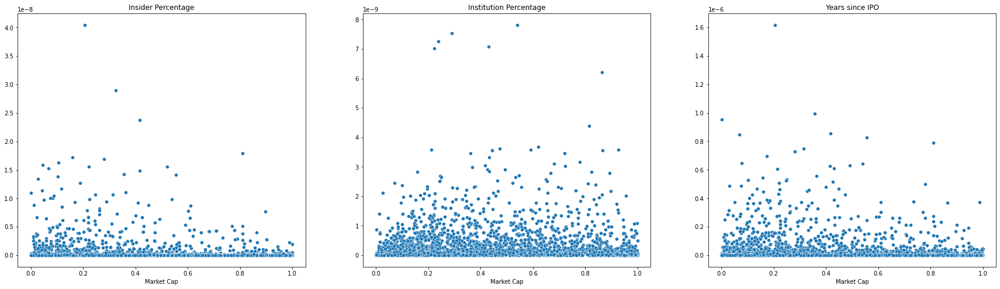

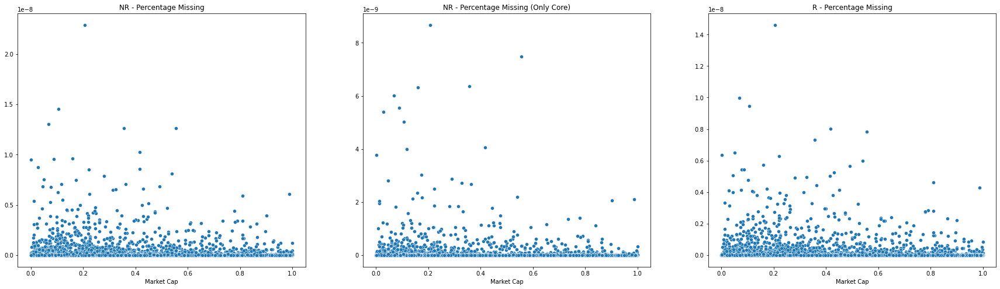

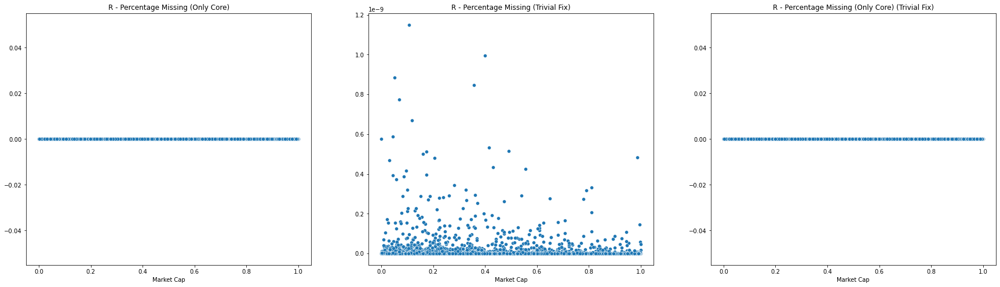

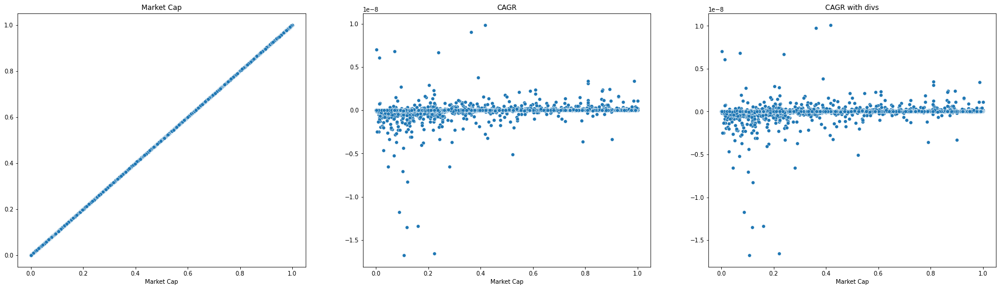

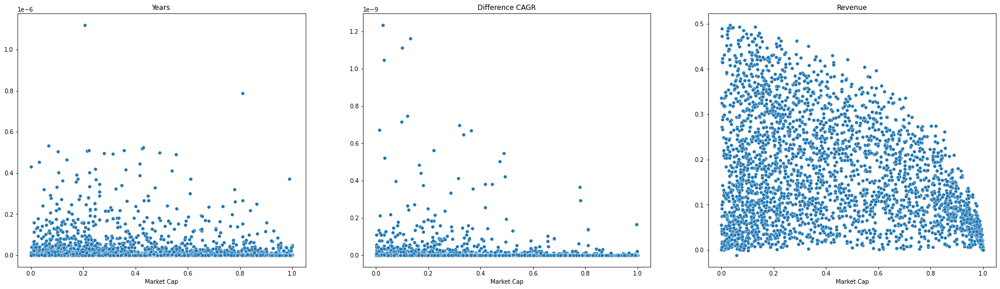

...

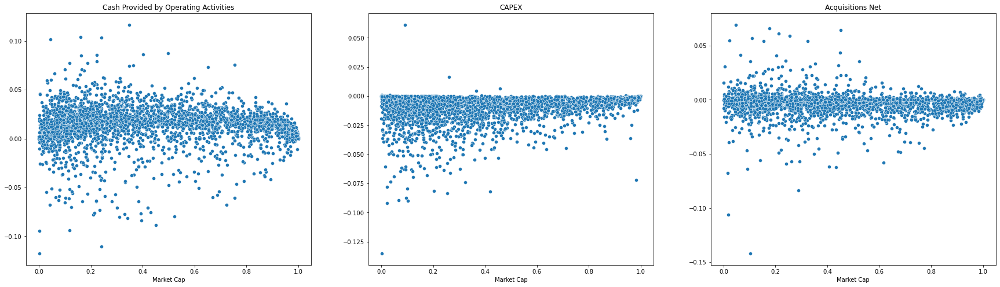

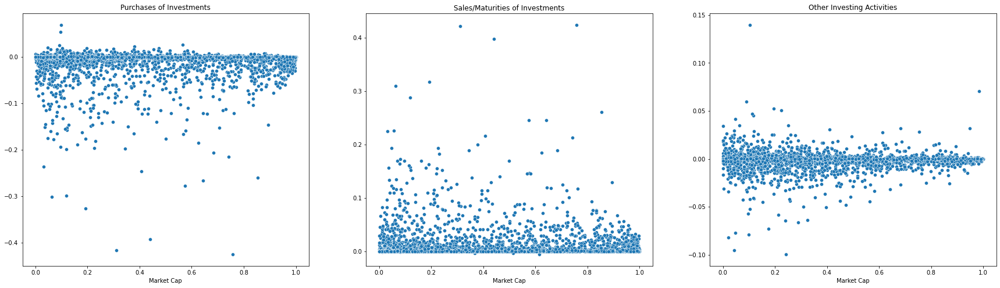

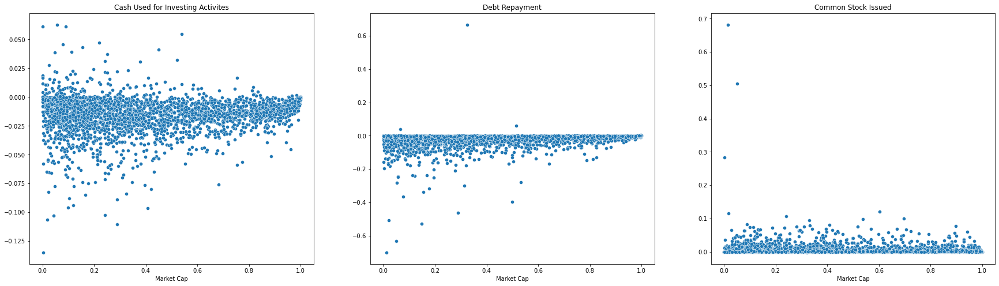

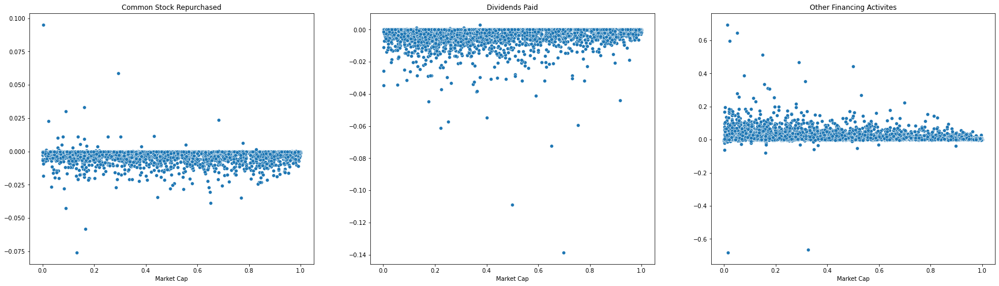

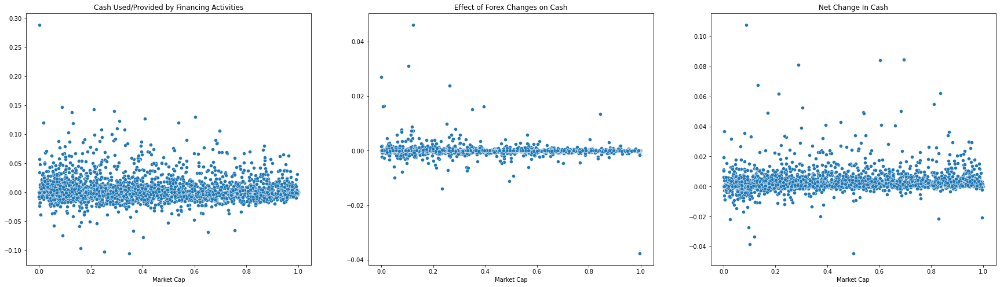

In [60]:
plt.rcParams['figure.figsize'] = [30, 8]

num_cols = 3
num_rows = int(aux.shape[1]/num_cols)


desfase_texto_x = aux["Market Cap"].mean() / 12

for j in range(num_rows):
    desfase = (j*num_cols)

    if desfase >= 103:
        break

    fig, axs = plt.subplots(ncols=num_cols)
    

    for i in range(num_cols):
        columna = aux.columns[i+desfase]
        

        sns.scatterplot(x=aux["Market Cap"], y=aux[columna], ax=axs[i])
        # for index, row in aux.iterrows():
        #     axs[i].text(x=aux.loc[index, "Market Cap"] + desfase_texto_x, y=aux.loc[index, columna], s=index)

        axs[i].set_title(columna)
        axs[i].set_ylabel('')



In [61]:
from sklearn.preprocessing import StandardScaler
# Esta vez con datos normalizados
# Normalizamos los datos
standardScaler = StandardScaler()
old_index = res_df.index
old_columns = res_df.columns
aux = standardScaler.fit_transform(res_df.copy())
aux = pd.DataFrame(aux, index=old_index, columns=old_columns)

C:\Users\juani\AppData\Local\Temp/ipykernel_14684/3498851792.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(ncols=num_cols)


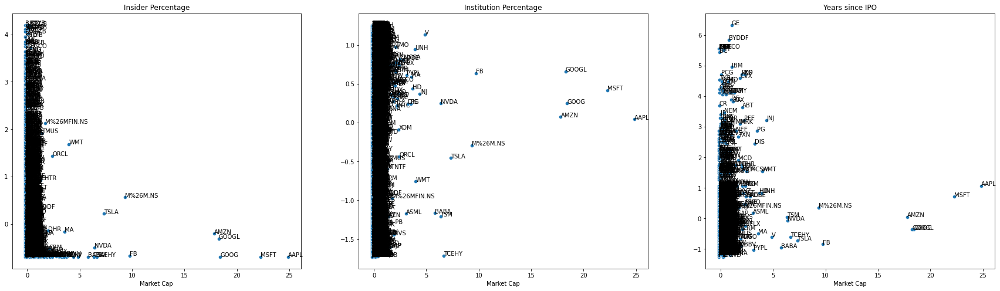

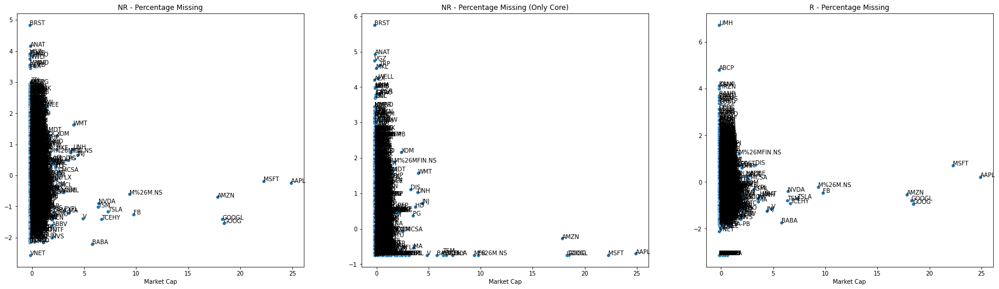

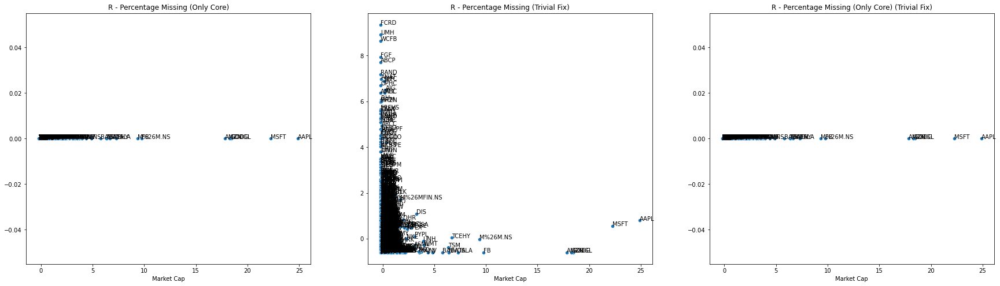

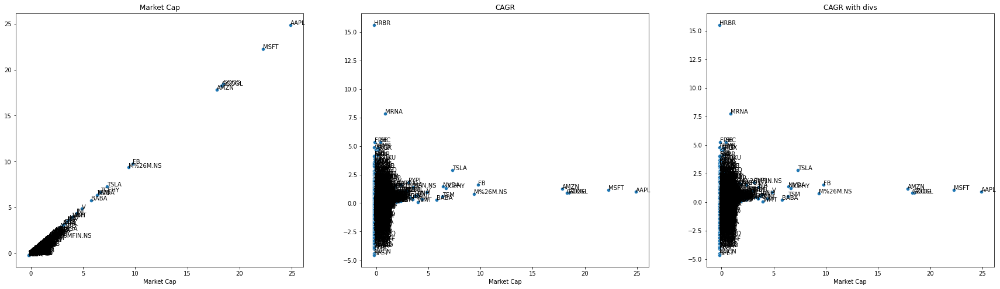

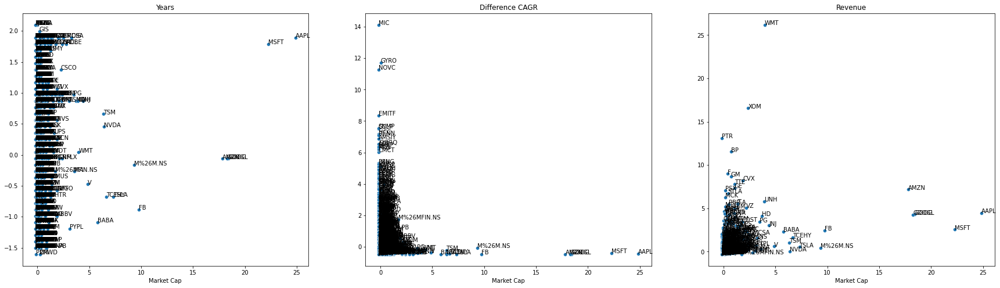

...

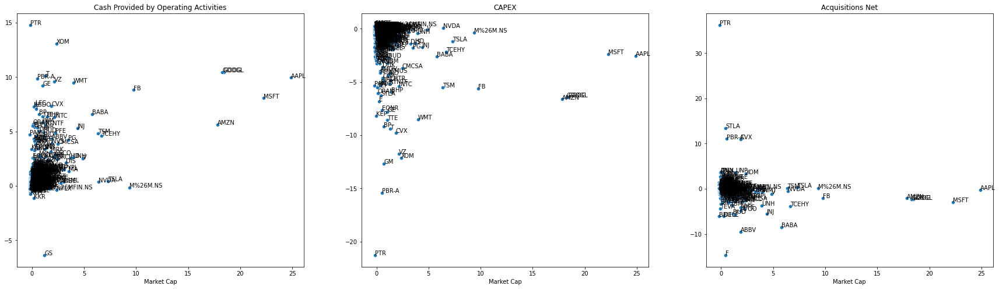

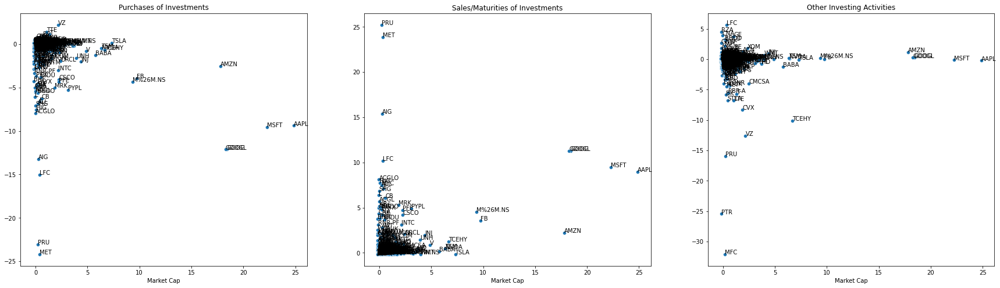

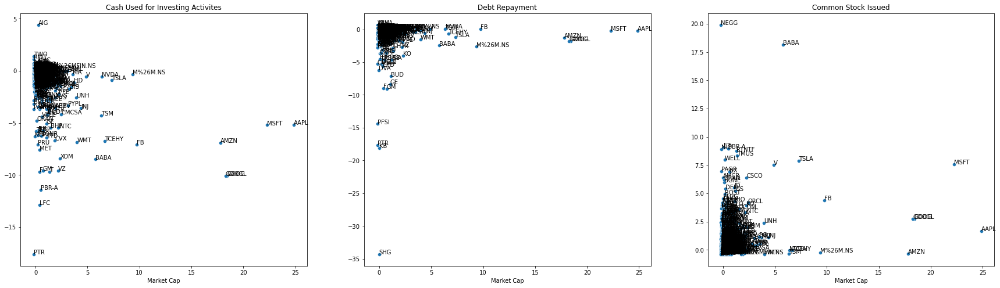

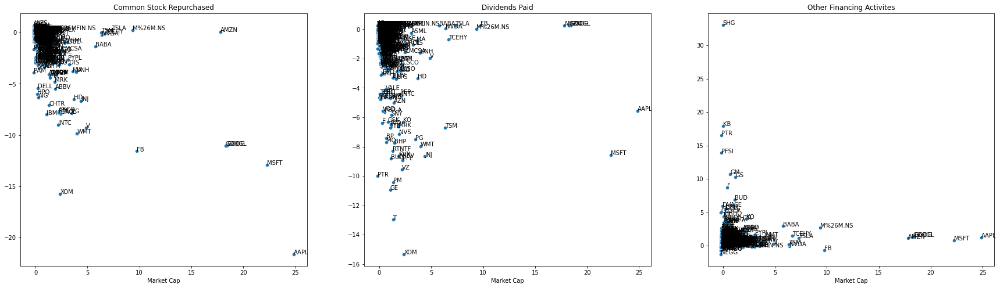

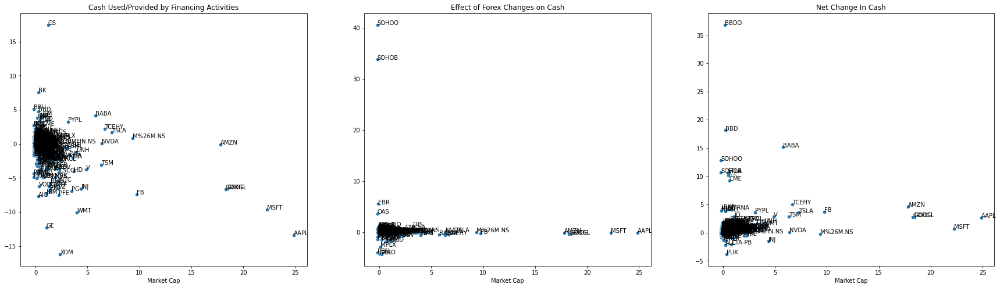

In [96]:
plt.rcParams['figure.figsize'] = [30, 8]

num_cols = 3
num_rows = int(aux.shape[1]/num_cols)


desfase_texto_x = aux["Market Cap"].mean() / 2

for j in range(num_rows):
    desfase = (j*num_cols)

    if desfase >= 103:
        break

    fig, axs = plt.subplots(ncols=num_cols)
    

    for i in range(num_cols):
        columna = aux.columns[i+desfase]
        

        sns.scatterplot(x=aux["Market Cap"], y=aux[columna], ax=axs[i])
        for index, row in aux.iterrows():
            axs[i].text(x=aux.loc[index, "Market Cap"] + desfase_texto_x, y=aux.loc[index, columna], s=index)

        axs[i].set_title(columna)
        axs[i].set_ylabel('')



In [104]:
basic_data.to_csv("Basic_information_cleaned4.csv")